In [81]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeRegressor


In [82]:
df_train=pd.read_excel("C:/Users/adity/OneDrive/Desktop/Analytics Vidya/Book  Price Prediction/Participants_Data/Data_Train.xlsx")
df_test=pd.read_excel("C:/Users/adity/OneDrive/Desktop/Analytics Vidya/Book  Price Prediction/Participants_Data/Data_Test.xlsx")



Examine the Data.
1)Use Describe.
2)use info
3)check the datatypes.
4)Look for Null values.

In [83]:
df_train.head()

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
0,The Prisoner's Gold (The Hunters 3),Chris Kuzneski,"Paperback,– 10 Mar 2016",4.0 out of 5 stars,8 customer reviews,THE HUNTERS return in their third brilliant no...,Action & Adventure (Books),Action & Adventure,220.00
1,Guru Dutt: A Tragedy in Three Acts,Arun Khopkar,"Paperback,– 7 Nov 2012",3.9 out of 5 stars,14 customer reviews,A layered portrait of a troubled genius for wh...,Cinema & Broadcast (Books),"Biographies, Diaries & True Accounts",202.93
2,Leviathan (Penguin Classics),Thomas Hobbes,"Paperback,– 25 Feb 1982",4.8 out of 5 stars,6 customer reviews,"""During the time men live without a common Pow...",International Relations,Humour,299.00
3,A Pocket Full of Rye (Miss Marple),Agatha Christie,"Paperback,– 5 Oct 2017",4.1 out of 5 stars,13 customer reviews,A handful of grain is found in the pocket of a...,Contemporary Fiction (Books),"Crime, Thriller & Mystery",180.00
4,LIFE 70 Years of Extraordinary Photography,Editors of Life,"Hardcover,– 10 Oct 2006",5.0 out of 5 stars,1 customer review,"For seven decades, ""Life"" has been thrilling t...",Photography Textbooks,"Arts, Film & Photography",965.62


In [84]:
df_train.columns

Index(['Title', 'Author', 'Edition', 'Reviews', 'Ratings', 'Synopsis', 'Genre',
       'BookCategory', 'Price'],
      dtype='object')

In [85]:
df_train.describe()

,Price
count,6237.000000
mean,560.707516
std,690.110657
min,25.000000
25%,249.180000
50%,373.000000
75%,599.000000
max,14100.000000


In [86]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6237 entries, 0 to 6236
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Title         6237 non-null   object 
 1   Author        6237 non-null   object 
 2   Edition       6237 non-null   object 
 3   Reviews       6237 non-null   object 
 4   Ratings       6237 non-null   object 
 5   Synopsis      6237 non-null   object 
 6   Genre         6237 non-null   object 
 7   BookCategory  6237 non-null   object 
 8   Price         6237 non-null   float64
dtypes: float64(1), object(8)
memory usage: 438.7+ KB


In [87]:
print("Train Data",df_train.isnull().sum())
print("\n ")
print("Test Data",df_test.isnull().sum())

Train Data Title           0
Author          0
Edition         0
Reviews         0
Ratings         0
Synopsis        0
Genre           0
BookCategory    0
Price           0
dtype: int64

 
Test Data Title           0
Author          0
Edition         0
Reviews         0
Ratings         0
Synopsis        0
Genre           0
BookCategory    0
dtype: int64


It appears that dats et has no null values.

Exploratory Data Analysis

[(25.0, 2000.0)]

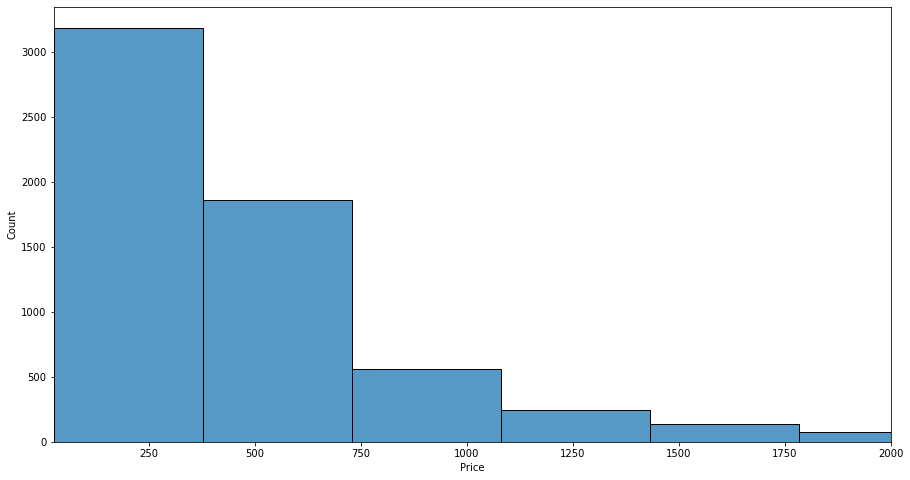

In [88]:
plt.figure(figsize=(15,8))
ax=sns.histplot(data=df_train, x='Price', bins=40)
ax.set(xlim=(min(df_train['Price']), 2000))

Most books (more than 3000 of the 6237) are priced between Rs 25 and Rs 375.
As the price of books increase, the number of takers decrease.

<AxesSubplot:ylabel='Price'>

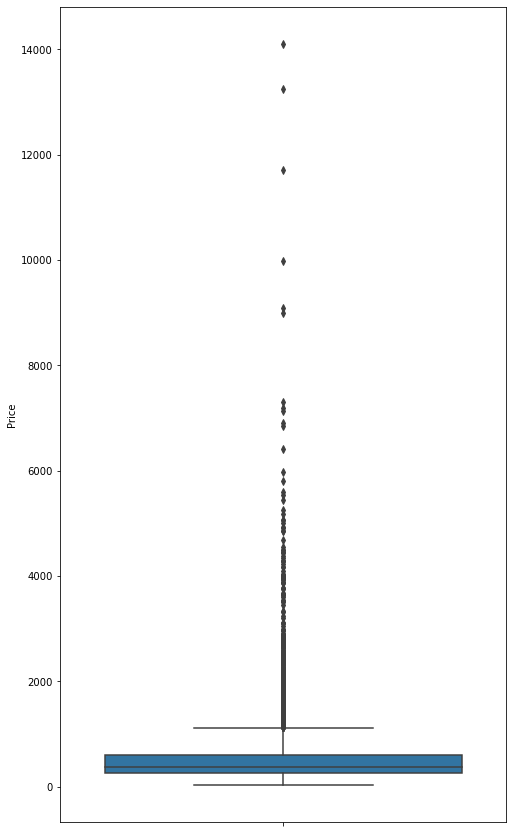

In [89]:
plt.figure(figsize=(8,15))
sns.boxplot(y=df_train['Price'])

Most of the distrbution lies between 25 and 1000 Rupees. 
There are outliers, above 6000 Rs and 8000 Rs, these outliers influence adversely the performance of the model.
We should remove them.

In [90]:
print("Books priced above Rupees 2000 is %d" %np.where(df_train['Price']>=2000)[0].shape[0])
print("Books priced above Rupees 4000 is %d" %np.where(df_train['Price']>=4000)[0].shape[0])
print("Books priced above Rupees 6000 is %d" %np.where(df_train['Price']>=6000)[0].shape[0])
print("Books priced above Rupees 8000 is %d" %np.where(df_train['Price']>=8000)[0].shape[0])



Books priced above Rupees 2000 is 187
Books priced above Rupees 4000 is 43
Books priced above Rupees 6000 is 12
Books priced above Rupees 8000 is 6


Book priced above 2000 are 3% of the data.
Books priced above 4000 are 0.7% of the data.
We will remove the books priced above 4000.

Npte that I am removing these values only in train dataset. This is to design a somewhat accurate model.
I am NOT changing the test dataset any how.


In [91]:
ab_4000=np.where(df_train['Price']>=4000)

In [92]:
ab_4000

(array([ 450,  574,  886,  935,  984, 1293, 1364, 1689, 1744, 1939, 2455,
        2560, 2607, 2818, 2941, 3281, 3633, 3703, 3759, 3764, 3861, 4019,
        4251, 4282, 4301, 4395, 4463, 4495, 4736, 4877, 4922, 5101, 5133,
        5139, 5567, 5704, 5705, 5825, 5896, 5897, 5923, 6018, 6059],
       dtype=int64),)

In [93]:
df_train.drop(axis=0, index=list(ab_4000[0]), inplace=True)

<AxesSubplot:ylabel='Price'>

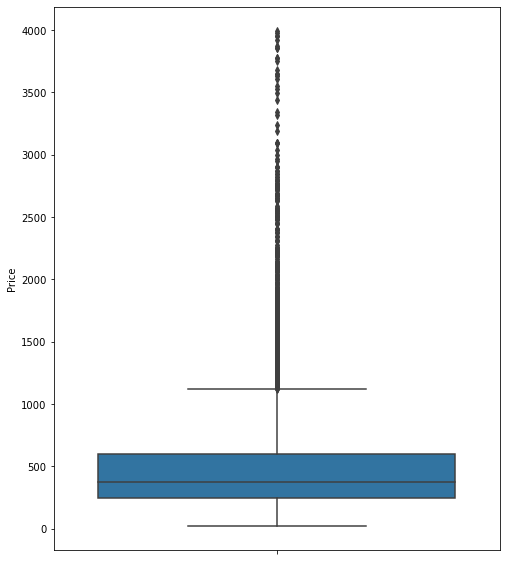

In [94]:
plt.figure(figsize=(8,10))
sns.boxplot(y=df_train['Price'])

The Interquartile range is between 200 and 1100 Indian Rupees.
This is where our 75% of the data lies.



In [95]:
df_train['Title'].unique()

array(["The Prisoner's Gold (The Hunters 3)",
       'Guru Dutt: A Tragedy in Three Acts',
       'Leviathan (Penguin Classics)', ...,
       'The Duke And I: Number 1 in series (Bridgerton Family)',
       'Frostfire (Kanin Chronicles)', 'The First Order (Sam Capra)'],
      dtype=object)

In [96]:
len(df_train['Title'].unique())

5529

In [97]:
print(df_train['Title'].value_counts())

Casino Royale: James Bond 007 (Vintage)                                               4
A Game of Thrones (A Song of Ice and Fire)                                            4
Anil's Ghost                                                                          3
The Cuckoo's Calling: Cormoran Strike Book 1                                          3
Neverwhere                                                                            3
                                                                                     ..
Calvin And Hobbes Volume 3: In the Shadow of the Night: The Calvin & Hobbes Series    1
Ouch that hearts                                                                      1
The Swiss Family Robinson: The Graphic Novel (Campfire Graphic Novels)                1
Guinness World Records 2018: Meet our Real-Life Superheroes                           1
Nouns (Quick, Smart Grammar)                                                          1
Name: Title, Length: 5529, dtype

In [98]:
df_train[df_train['Title']=='Casino Royale: James Bond 007 (Vintage)']

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
2111,Casino Royale: James Bond 007 (Vintage),Ian Fleming,"Paperback,– 2 Aug 2012",4.6 out of 5 stars,14 customer reviews,The first 007 adventure by Ian Fleming - now w...,Action & Adventure (Books),"Crime, Thriller & Mystery",359.70
4202,Casino Royale: James Bond 007 (Vintage),Ian Fleming,"Paperback,– 2 Aug 2012",4.6 out of 5 stars,14 customer reviews,The first 007 adventure by Ian Fleming - now w...,Action & Adventure (Books),Romance,359.90
4423,Casino Royale: James Bond 007 (Vintage),Ian Fleming,"Paperback,– 2 Aug 2012",4.6 out of 5 stars,14 customer reviews,The first 007 adventure by Ian Fleming - now w...,Action & Adventure (Books),Action & Adventure,335.00
5162,Casino Royale: James Bond 007 (Vintage),Ian Fleming,"Paperback,– 2 Aug 2012",4.6 out of 5 stars,14 customer reviews,The first 007 adventure by Ian Fleming - now w...,Action & Adventure (Books),Action & Adventure,346.68


In [99]:
df_train[df_train['Title']=='A Game of Thrones (A Song of Ice and Fire)']

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
531,A Game of Thrones (A Song of Ice and Fire),George R.R. Martin,"Hardcover,– Special Edition, 18 Oct 2016",5.0 out of 5 stars,3 customer reviews,Published in celebration of the twentieth anni...,Action & Adventure (Books),Romance,1150.0
2118,A Game of Thrones (A Song of Ice and Fire),George R.R. Martin,"Hardcover,– Special Edition, 18 Oct 2016",5.0 out of 5 stars,3 customer reviews,Published in celebration of the twentieth anni...,Action & Adventure (Books),"Crime, Thriller & Mystery",1150.0
3070,A Game of Thrones (A Song of Ice and Fire),George R.R. Martin,"Hardcover,– Special Edition, 18 Oct 2016",5.0 out of 5 stars,3 customer reviews,Published in celebration of the twentieth anni...,Action & Adventure (Books),Action & Adventure,789.0
5257,A Game of Thrones (A Song of Ice and Fire),George R.R. Martin,"Hardcover,– Special Edition, 18 Oct 2016",5.0 out of 5 stars,4 customer reviews,Published in celebration of the twentieth anni...,Action & Adventure (Books),Action & Adventure,990.0


In [100]:
df_train[df_train['Title']=='Shantaram']

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
643,Shantaram,Gregory David Roberts,"Paperback,– 24 Mar 2005",4.6 out of 5 stars,177 customer reviews,"""It took me a long time and most of the world ...",Action & Adventure (Books),Action & Adventure,359.0
2081,Shantaram,Gregory David Roberts,"Paperback,– 24 Mar 2005",4.6 out of 5 stars,177 customer reviews,"""It took me a long time and most of the world ...",Action & Adventure (Books),"Crime, Thriller & Mystery",481.0
3459,Shantaram,Gregory David Roberts,"Paperback,– 24 Mar 2005",4.6 out of 5 stars,180 customer reviews,"""It took me a long time and most of the world ...",Action & Adventure (Books),Action & Adventure,420.0


In [101]:
df_train[df_train['Title']=='Complete Guide to Digital Photography']

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
1588,Complete Guide to Digital Photography,Ian Farrell,"Paperback,– 2 Jan 2018",4.7 out of 5 stars,6 customer reviews,Are you intent on capturing the perfect sunset...,Photography Textbooks,"Arts, Film & Photography",646.0
2663,Complete Guide to Digital Photography,Ian Farrell,"Paperback,– 2 Jan 2018",4.7 out of 5 stars,6 customer reviews,Are you intent on capturing the perfect sunset...,Photography Textbooks,"Computing, Internet & Digital Media",646.0
5480,Complete Guide to Digital Photography,Ian Farrell,"Paperback,– 25 Sep 2014",5.0 out of 5 stars,1 customer review,Are you intent on capturing the perfect sunset...,Photography Textbooks,"Computing, Internet & Digital Media",855.0


Now what does the above tables say?
1)There are 5529 titles against 6194 long dataset. The Title is not at all a good predictor of price as far as this dataset is concerned. I will drop this column.

2)However, as one can see that there are several titles repeating(with the maximum frequency of 4).Some times there is a price fluctuation within the same title, given most of the attributes (Author, Edition, Synopsis, Genre, Book Category) remaining same. 
how to handle this data?
Of course we dont need duplicates.

Since many columns are in text.
Let us do some processing.
1)Title, Author, Genre, BookCategory: Convert to lowercase. Remove unwanted characters.
2)Edition: Extract Date, Month, Year, Paperback or Harcover.
3)Reviews and Ratings: Extract the Numerical Feature.

In [102]:
def text_process(in_df, col,):
    import re
    
    #Convert to lower case
    in_df[col]=in_df[col].apply(lambda x:x.lower())
     
    
    #Replace Special characters
    in_df[col]=in_df[col].apply(lambda x:re.sub("[\W]", " ", x))
  
    

In [103]:
col_list=['Title','Author', 'Edition','Ratings','Synopsis','Genre','BookCategory']
for col in col_list:
    text_process(df_train, col)
    text_process(df_test, col)

In [104]:
df_train.head()

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
0,the prisoner s gold the hunters 3,chris kuzneski,paperback 10 mar 2016,4.0 out of 5 stars,8 customer reviews,the hunters return in their third brilliant no...,action adventure books,action adventure,220.00
1,guru dutt a tragedy in three acts,arun khopkar,paperback 7 nov 2012,3.9 out of 5 stars,14 customer reviews,a layered portrait of a troubled genius for wh...,cinema broadcast books,biographies diaries true accounts,202.93
2,leviathan penguin classics,thomas hobbes,paperback 25 feb 1982,4.8 out of 5 stars,6 customer reviews,during the time men live without a common pow...,international relations,humour,299.00
3,a pocket full of rye miss marple,agatha christie,paperback 5 oct 2017,4.1 out of 5 stars,13 customer reviews,a handful of grain is found in the pocket of a...,contemporary fiction books,crime thriller mystery,180.00
4,life 70 years of extraordinary photography,editors of life,hardcover 10 oct 2006,5.0 out of 5 stars,1 customer review,for seven decades life has been thrilling t...,photography textbooks,arts film photography,965.62


In [105]:
len(df_train['Author'].unique())

3641

In [106]:
df_train['Author'].value_counts()

agatha christie     69
ladybird            50
dk                  48
albert uderzo       34
herge               34
                    ..
angus dunnington     1
dalton trumbo        1
joe hyams            1
piers paul read      1
alex pentland        1
Name: Author, Length: 3641, dtype: int64

There are 3641 unique authors, once again may not be a good predictor but Authors like Agatha christie, ladybird, albert underzo are very frequent. 
However Authors do influence the price. We will retin the original names of the frequr ones while replacing the less frequent with a generic name.

Extract the numerics only in Reviews and Ratings

In [107]:
df_train['Reviews']=df_train['Reviews'].apply(lambda x: pd.to_numeric(x.split()[0]))
df_train['Ratings']=df_train['Ratings'].apply(lambda x: pd.to_numeric(x.split()[0]))


df_test['Reviews']=df_test['Reviews'].apply(lambda x: pd.to_numeric(x.split()[0]))
df_test['Ratings']=df_test['Ratings'].apply(lambda x: pd.to_numeric(x.split()[0]))


In [108]:
df_train.head()

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price
0,the prisoner s gold the hunters 3,chris kuzneski,paperback 10 mar 2016,4.0,8,the hunters return in their third brilliant no...,action adventure books,action adventure,220.00
1,guru dutt a tragedy in three acts,arun khopkar,paperback 7 nov 2012,3.9,14,a layered portrait of a troubled genius for wh...,cinema broadcast books,biographies diaries true accounts,202.93
2,leviathan penguin classics,thomas hobbes,paperback 25 feb 1982,4.8,6,during the time men live without a common pow...,international relations,humour,299.00
3,a pocket full of rye miss marple,agatha christie,paperback 5 oct 2017,4.1,13,a handful of grain is found in the pocket of a...,contemporary fiction books,crime thriller mystery,180.00
4,life 70 years of extraordinary photography,editors of life,hardcover 10 oct 2006,5.0,1,for seven decades life has been thrilling t...,photography textbooks,arts film photography,965.62


Now we need to process the Edition.
Here in we have to extract features like paperback/hardcover (they influence the price), Day (Weekends or Weekdays influence price), Months and year (fresh editions are high priced generally).
We will create seperate columns all the types here.

In [109]:
#Extract the cover type (Paperback or Hardcover)
df_train['Cover']=df_train['Edition'].apply(lambda x:x.split()[0])
df_train['Cover']=df_train['Cover'].apply(lambda x: 'paperback' if ((x=='mass') |
                                                                    (x=='perfect') |
                                                                    (x=='french') |
                                                                    (x=='german') |
                                                                    (x=='spanish')|
                                                                    (x=='kannada')
                                                                   ) 
                                          
                                          
                                                       else x)


df_test['Cover']=df_test['Edition'].apply(lambda x:x.split()[0])
df_test['Cover']=df_test['Cover'].apply(lambda x: 'paperback' if ((x=='mass') |
                                                                    (x=='perfect') |
                                                                    (x=='french') |
                                                                    (x=='german') |
                                                                    (x=='spanish')|
                                                                    (x=='kannada')
                                                                   ) 
                                          
                                          
                                                       else x)




In [110]:
df_train['Cover'].value_counts()

paperback     5335
hardcover      799
sheet           24
flexibound      15
cards            8
spiral           4
tankobon         3
loose            2
plastic          1
board            1
library          1
leather          1
Name: Cover, dtype: int64

In [111]:
#User defined function to extract Day, Month and Year

def day_month_year(in_df,col):
    day_list=[]
    year_list=[]
    month_list=[]
    for itm in enumerate(in_df[col]):
        
        day=re.findall('\d{2}', itm[1])
        day_list.append(np.nan) if not(day) else day_list.append(pd.to_numeric(day[0]))
                       
        yr=re.findall('\d{4}', itm[1])
        year_list.append(np.nan) if not(yr) else year_list.append(pd.to_numeric(yr[0]))
        
        mnth=re.findall('jan|feb|mar|apr|may|jun|jul|aug|sep|oct|nov|dec', itm[1])
        month_list.append(np.nan) if not(mnth) else month_list.append(mnth[0])
       
                
        
    return([day_list,year_list,month_list])
        

In [112]:
import re
d_m_y=day_month_year(df_train, 'Edition')
d_m_y_test=day_month_year(df_test, 'Edition')


In [113]:
df_train['Day']=d_m_y[0]
df_train['Year']=d_m_y[1]
df_train['Month']=d_m_y[2]

df_test['Day']=d_m_y_test[0]
df_test['Year']=d_m_y_test[1]
df_test['Month']=d_m_y_test[2]



In [114]:
df_train.head()

,Title,Author,Edition,Reviews,Ratings,Synopsis,Genre,BookCategory,Price,Cover,Day,Year,Month
0,the prisoner s gold the hunters 3,chris kuzneski,paperback 10 mar 2016,4.0,8,the hunters return in their third brilliant no...,action adventure books,action adventure,220.00,paperback,10.0,2016.0,mar
1,guru dutt a tragedy in three acts,arun khopkar,paperback 7 nov 2012,3.9,14,a layered portrait of a troubled genius for wh...,cinema broadcast books,biographies diaries true accounts,202.93,paperback,20.0,2012.0,nov
2,leviathan penguin classics,thomas hobbes,paperback 25 feb 1982,4.8,6,during the time men live without a common pow...,international relations,humour,299.00,paperback,25.0,1982.0,feb
3,a pocket full of rye miss marple,agatha christie,paperback 5 oct 2017,4.1,13,a handful of grain is found in the pocket of a...,contemporary fiction books,crime thriller mystery,180.00,paperback,20.0,2017.0,oct
4,life 70 years of extraordinary photography,editors of life,hardcover 10 oct 2006,5.0,1,for seven decades life has been thrilling t...,photography textbooks,arts film photography,965.62,hardcover,10.0,2006.0,oct


Little More Feature engineering.
1)Now Reviews and Ratings can be merged (by multiplying together) in to one column.
2)The column Genre and BookCategory may slightly vary in their effect. I believe BookCategory is a better predictor.
3)The remaining column is Synopsis. Now how to account for it? One way I can think of it is using Sentiment Analysis. Get the sentiment out of the synopsis, we will see how the polarity score of the statement shall effect the Price.

In [115]:
df_train['BookCategory'].unique()

array(['action   adventure', 'biographies  diaries   true accounts',
       'humour', 'crime  thriller   mystery', 'arts  film   photography',
       'sports', 'language  linguistics   writing',
       'computing  internet   digital media', 'romance',
       'comics   mangas', 'politics'], dtype=object)

In [116]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sid_obj = SentimentIntensityAnalyzer()

In [117]:
sid_obj.polarity_scores('I admire Dhoni')

{'neg': 0.0, 'neu': 0.392, 'pos': 0.608, 'compound': 0.4767}

Vader Sentiment has four scores (Positive, Negative, Neutral and compund to tell us the nature of the statement.
I am taking all the four sentiments to evaluate the synopsis.

In [118]:
df_train['syn_neg']=df_train['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['neg'])
df_train['syn_pos']=df_train['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['pos'])
df_train['syn_neut']=df_train['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['neu'])
df_train['syn_comp']=df_train['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['compound'])

df_test['syn_neg']=df_test['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['neg'])
df_test['syn_pos']=df_test['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['pos'])
df_test['syn_neut']=df_test['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['neu'])
df_test['syn_comp']=df_test['Synopsis'].apply(lambda x:sid_obj.polarity_scores(x)['compound'])





In [119]:
#Merge Reviews and Ratings in to one column.
df_train['Review_score']=df_train['Reviews']*df_train['Ratings']
df_test['Review_score']=df_test['Reviews']*df_test['Ratings']


In [120]:
df_train.columns

Index(['Title', 'Author', 'Edition', 'Reviews', 'Ratings', 'Synopsis', 'Genre',
       'BookCategory', 'Price', 'Cover', 'Day', 'Year', 'Month', 'syn_neg',
       'syn_pos', 'syn_neut', 'syn_comp', 'Review_score'],
      dtype='object')

Dropt the unnecessary columns.
Next in we examine how our output behaves with input.
This is where fun begins.

In [121]:
df_train.drop(columns=['Reviews','Ratings','Synopsis','Edition'], axis=1, inplace=True)
df_test.drop(columns=['Reviews','Ratings','Synopsis','Edition'], axis=1, inplace=True)


In [122]:
df_train.columns

Index(['Title', 'Author', 'Genre', 'BookCategory', 'Price', 'Cover', 'Day',
       'Year', 'Month', 'syn_neg', 'syn_pos', 'syn_neut', 'syn_comp',
       'Review_score'],
      dtype='object')

As I examine the data and the output behavior, note down all the observations.
These are necessary guidelines in developing a model.

In [123]:
len(df_train['Title'].unique())

5524

In [124]:
len(df_train['Author'].unique())

3641

There are 5524 unique titles against 6194 data samples. Title is a weak predictor I will drop it.

Next in The Authors. There are 3641 unique authors.
Auhtors do influence the price, because of their personal branding.
So I have to consider them though they cost computing power

In [125]:
df_train.head()

,Title,Author,Genre,BookCategory,Price,Cover,Day,Year,Month,syn_neg,syn_pos,syn_neut,syn_comp,Review_score
0,the prisoner s gold the hunters 3,chris kuzneski,action adventure books,action adventure,220.00,paperback,10.0,2016.0,mar,0.067,0.152,0.781,0.8537,32.0
1,guru dutt a tragedy in three acts,arun khopkar,cinema broadcast books,biographies diaries true accounts,202.93,paperback,20.0,2012.0,nov,0.057,0.235,0.708,0.9931,54.6
2,leviathan penguin classics,thomas hobbes,international relations,humour,299.00,paperback,25.0,1982.0,feb,0.047,0.165,0.788,0.9891,28.8
3,a pocket full of rye miss marple,agatha christie,contemporary fiction books,crime thriller mystery,180.00,paperback,20.0,2017.0,oct,0.223,0.000,0.777,-0.9643,53.3
4,life 70 years of extraordinary photography,editors of life,photography textbooks,arts film photography,965.62,hardcover,10.0,2006.0,oct,0.054,0.153,0.793,0.9080,5.0


In [126]:
len(df_train['Genre'].unique())

343

In [127]:
df_train.drop(columns=['Title'], axis=1, inplace=True)
df_test.drop(columns=['Title'], axis=1, inplace=True)


In [128]:
df_train.head()

,Author,Genre,BookCategory,Price,Cover,Day,Year,Month,syn_neg,syn_pos,syn_neut,syn_comp,Review_score
0,chris kuzneski,action adventure books,action adventure,220.00,paperback,10.0,2016.0,mar,0.067,0.152,0.781,0.8537,32.0
1,arun khopkar,cinema broadcast books,biographies diaries true accounts,202.93,paperback,20.0,2012.0,nov,0.057,0.235,0.708,0.9931,54.6
2,thomas hobbes,international relations,humour,299.00,paperback,25.0,1982.0,feb,0.047,0.165,0.788,0.9891,28.8
3,agatha christie,contemporary fiction books,crime thriller mystery,180.00,paperback,20.0,2017.0,oct,0.223,0.000,0.777,-0.9643,53.3
4,editors of life,photography textbooks,arts film photography,965.62,hardcover,10.0,2006.0,oct,0.054,0.153,0.793,0.9080,5.0


Feature engineering is done.

Before jumping to deeper analysis. I am making few thoughts
The dataset has some strong predictors and some weak predictors.
Weak predictors are Genre, title and auhtor. Rest all can be regarded as Strong Predictors.

In [129]:
df_train.dropna(how="any", axis=0, inplace=True)
df_train.reset_index(inplace=False)

df_test.dropna(how="any", axis=0, inplace=True)
df_test.reset_index(inplace=False)



,index,Author,Genre,BookCategory,Cover,Day,Year,Month,syn_neg,syn_pos,syn_neut,syn_comp,Review_score
0,0,sir arthur conan doyle,short stories books,crime thriller mystery,paperback,19.0,1986.0,mar,0.049,0.099,0.853,0.9422,4224.0
1,1,gabriel n schenker,operating systems textbooks,computing internet digital media,paperback,26.0,2018.0,apr,0.013,0.076,0.910,0.9517,5.0
2,2,danielle steel,romance books,romance,paperback,17.0,2011.0,mar,0.083,0.261,0.656,0.9918,20.0
3,4,redman gairns,linguistics books,language linguistics writing,paperback,26.0,2011.0,dec,0.000,0.000,1.000,0.0000,39.6
4,5,john berger,arts history theory criticism books,arts film photography,paperback,20.0,2013.0,nov,0.000,0.178,0.822,0.9918,10.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1468,1555,susan weinschenk,design,computing internet digital media,paperback,14.0,2011.0,apr,0.019,0.134,0.847,0.9718,20.0
1469,1556,arun sagar,children s reference books,biographies diaries true accounts,paperback,20.0,2013.0,may,0.000,0.097,0.903,0.9099,46.8
1470,1557,khaled hosseini,humour books,humour,paperback,20.0,2011.0,sep,0.000,0.199,0.801,0.9284,20.0
1471,1558,heinz guderian,united states history,biographies diaries true accounts,paperback,22.0,2009.0,sep,0.172,0.037,0.790,-0.9732,10.5


In [130]:
df_train

,Author,Genre,BookCategory,Price,Cover,Day,Year,Month,syn_neg,syn_pos,syn_neut,syn_comp,Review_score
0,chris kuzneski,action adventure books,action adventure,220.00,paperback,10.0,2016.0,mar,0.067,0.152,0.781,0.8537,32.0
1,arun khopkar,cinema broadcast books,biographies diaries true accounts,202.93,paperback,20.0,2012.0,nov,0.057,0.235,0.708,0.9931,54.6
2,thomas hobbes,international relations,humour,299.00,paperback,25.0,1982.0,feb,0.047,0.165,0.788,0.9891,28.8
3,agatha christie,contemporary fiction books,crime thriller mystery,180.00,paperback,20.0,2017.0,oct,0.223,0.000,0.777,-0.9643,53.3
4,editors of life,photography textbooks,arts film photography,965.62,hardcover,10.0,2006.0,oct,0.054,0.153,0.793,0.9080,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6232,tom phillips,anthropology books,humour,322.00,paperback,20.0,2018.0,aug,0.071,0.151,0.778,0.9661,10.0
6233,stephenie meyer,contemporary fiction books,crime thriller mystery,421.00,paperback,21.0,2016.0,nov,0.142,0.118,0.740,-0.9097,29.7
6234,julia quinn,romance books,romance,399.00,paperback,20.0,2006.0,jun,0.098,0.258,0.644,0.9937,11.4
6235,amanda hocking,action adventure books,action adventure,319.00,paperback,15.0,2015.0,jan,0.117,0.256,0.627,0.9830,14.0


Now we have achieved feature engineering. 
Time to examine the nature of the inputs.

The below graph shows frequency of the book category in a histogram plot.


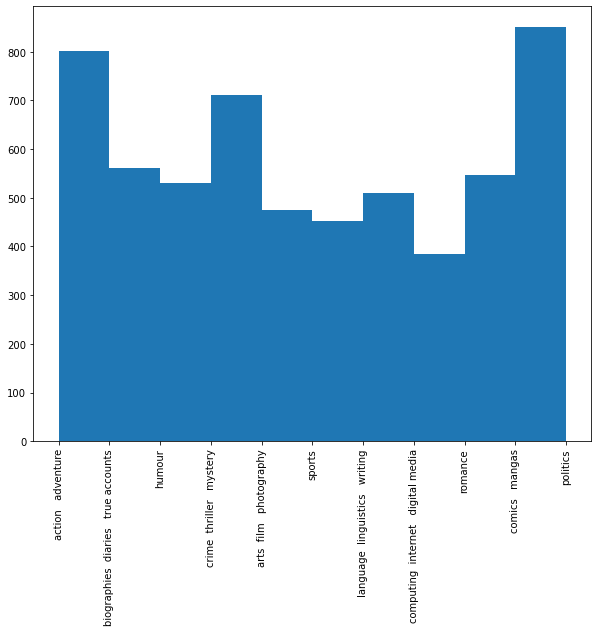

In [131]:
plt.figure(figsize=(10,8))
plt.hist(data=df_train, x='BookCategory')
_=plt.xticks(rotation=90)



In [132]:
def subplot_cols(in_df, cols):
    plt.figure(figsize=(15,10))
    
    for inc, col in zip(range(1, len(cols)+1), cols):
        plt.subplot(4,2,inc)
        plt.hist(x=in_df[col])
        plt.subplots_adjust(hspace = .5)
        plt.title(col)
        
    
    

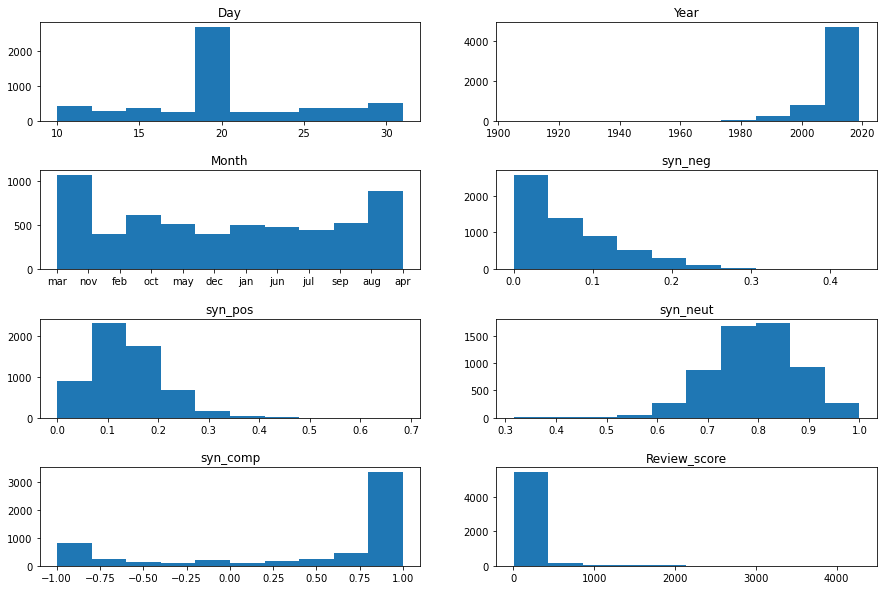

In [133]:
subplot_cols(df_train, ['Day','Year','Month','syn_neg','syn_pos','syn_neut','syn_comp','Review_score'])

In [134]:
def scatter_subplots(in_df, target, num_cols, col_list):
    plt.figure(figsize=(15,15))
    
    for num in range(0, num_cols):
        plt.subplot(4,2,num+1)
        plt.scatter(x=in_df[col_list[num]], y=in_df[target])
        plt.xlim([min(in_df[col_list[num]]),max(in_df[col_list[num]])])
        plt.title(col_list[num]+" "+ "vs" + target)
  

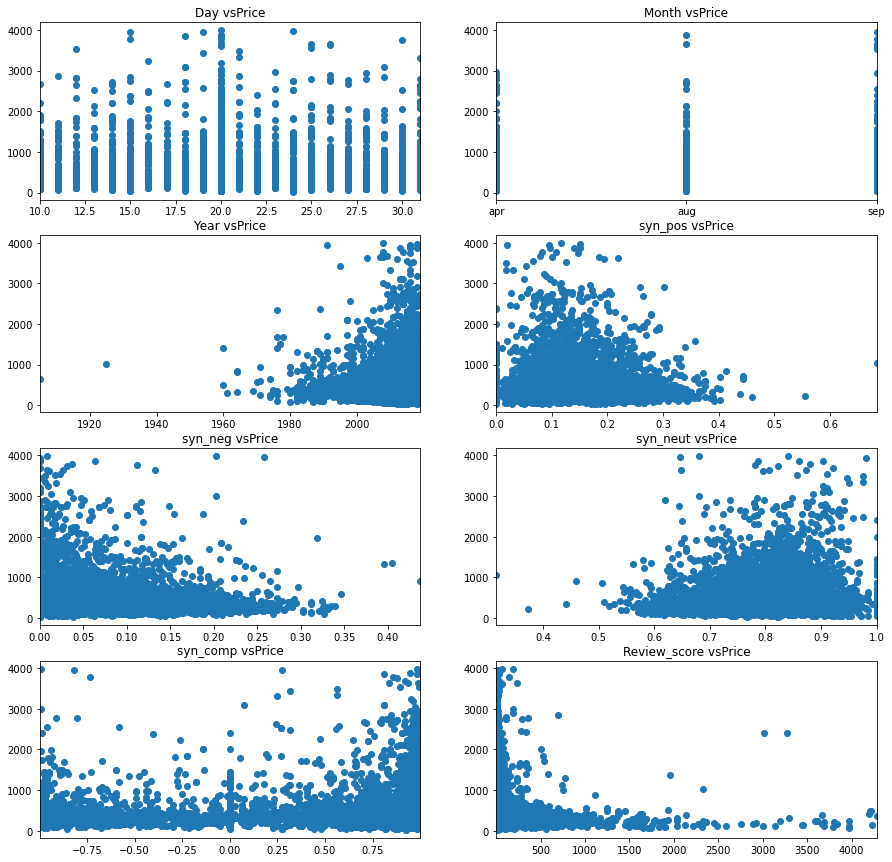

In [135]:
scatter_subplots(df_train, 'Price',8, ['Day','Month','Year','syn_pos','syn_neg','syn_neut','syn_comp', 'Review_score'])

Text(0.5, 1.0, 'Month vs Price')

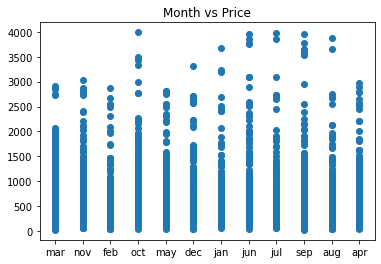

In [90]:

plt.scatter(x=df_train['Month'], y=df_train['Price'])
plt.title("Month vs Price")
  

Observations from above distribution plots
1)Days around 20th of each month are more frequent ones.
2)Latest Editions (close to 2020) are most frequent books in sale.
3)Readers prefer synopsis that have more Neutral sentiment. Extremes are less frequent.

Scatter Plot Observations.
1)April, August and September are busy months.
2)Just like distribution plot latest editions are priced higher.
3)Synopsis with a higher negative score are priced lower. Negative sentiment do not attract customers it appears. Those with more neutrality attract higher price.

Though a particular day and a month have effect on distribution , they dont seem to influence price of the book.

Note: Here I have used Matpllotlib histplot. Use seaborn jointplot and seaborn jointgrid to observe the data in deeper detail.


Below is decision tree implementation for certain features.
I have done this so realize the relative importance of each feature.
For example, the root node in each of the plot is most decisive feature, the second root node is second best and so on. Later on in XGboost we will know the feature importances in ensemble.

Details like this might help in microengineering and help improve the accuracy of the model.

In [136]:
df_train.head()

,Author,Genre,BookCategory,Price,Cover,Day,Year,Month,syn_neg,syn_pos,syn_neut,syn_comp,Review_score
0,chris kuzneski,action adventure books,action adventure,220.00,paperback,10.0,2016.0,mar,0.067,0.152,0.781,0.8537,32.0
1,arun khopkar,cinema broadcast books,biographies diaries true accounts,202.93,paperback,20.0,2012.0,nov,0.057,0.235,0.708,0.9931,54.6
2,thomas hobbes,international relations,humour,299.00,paperback,25.0,1982.0,feb,0.047,0.165,0.788,0.9891,28.8
3,agatha christie,contemporary fiction books,crime thriller mystery,180.00,paperback,20.0,2017.0,oct,0.223,0.000,0.777,-0.9643,53.3
4,editors of life,photography textbooks,arts film photography,965.62,hardcover,10.0,2006.0,oct,0.054,0.153,0.793,0.9080,5.0


In [356]:
from sklearn import tree
import dtreeviz
from dtreeviz.trees import *

reg = tree.DecisionTreeRegressor(max_depth=4, random_state=42)
reg.fit(df_train[['syn_neg','syn_pos','syn_neut', 'syn_comp','Review_score']], df_train['Price'])

# plot the tree
viz = dtreeviz(reg,
              x_data=df_train[['syn_neg','syn_pos','syn_neut', 'syn_comp','Review_score']],
              y_data=df_train['Price'],
              target_name='Price',
              feature_names=['syn_neg','syn_pos', 'syn_neut', 'syn_comp','Review_score'],
              show_node_labels = True,
              
             )
viz
              


C:\Users\adity\AppData\Roaming\Python\Python38\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [357]:
reg = tree.DecisionTreeRegressor(max_depth=4, random_state=42)
reg.fit(df_train[['Day','Year']], df_train['Price'])

# plot the tree
viz = dtreeviz(reg,
              x_data=df_train[['Day','Year']],
              y_data=df_train['Price'],
              target_name='Price',
              feature_names=['Day','Year'],
              show_node_labels = True,
              
             )
viz
              


C:\Users\adity\AppData\Roaming\Python\Python38\site-packages\sklearn\base.py:441: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


The Above dtree plot tells us the relative importance of the nodes.
For example in Dates year is the root node, it is the better classifier.
Similarly 'syn_neg' is the better classifier.

The method of classification (impurity), the threshold for classification can be altered for better tuning.

Now that Data analysis is done.
Let me create a model.
I am choosing XGboost here, I will also do some hyperparameter tuning.

(1.0, 4281.200000000001)

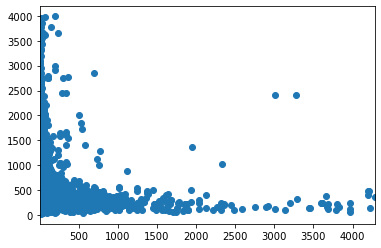

In [137]:
plt.scatter(x=df_train['Review_score'], y=df_train['Price'])
plt.xlim([min(df_train['Review_score']),max(df_train['Review_score']) ])


(0.0, 0.684)

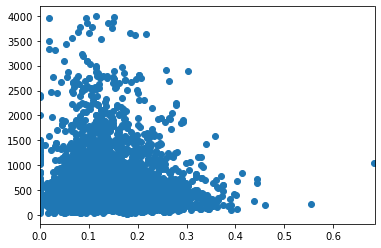

In [138]:
plt.scatter(x=df_train['syn_pos'], y=df_train['Price'])
plt.xlim([min(df_train['syn_pos']),max(df_train['syn_pos']) ])


In [303]:
#User defined function for 
def dummy_dataframe(in_df, col_list, df_list):
    
    _list=[]
    for df,col in zip(df_list, col_list):
        df=pd.get_dummies(in_df[col])
        _list.append(df)
    ret_df=pd.concat(_list, axis=1)
    return(ret_df)
  
    
    
    

In [304]:
df_train.columns

Index(['Author', 'Genre', 'BookCategory', 'Price', 'Cover', 'Day', 'Year',
       'Month', 'syn_neg', 'syn_pos', 'syn_neut', 'syn_comp', 'Review_score'],
      dtype='object')

In both test and train data sets, there are some categorical variables.
There may be mismatch between train and test dataset, regarding these variables. This may cause feature length issues.
Hence hot encoding has to be done for merged dataset and then split the datasets according to row length.

In [305]:
merged_df=pd.concat([df_train[['Author', 'Genre', 'BookCategory', 'Price', 'Cover', 'Day', 'Year','Month', 'syn_neg', 'syn_pos', 'syn_neut', 'syn_comp', 'Review_score']], df_test], axis=0)

In [306]:
df_auth=pd.DataFrame(merged_df['Author'].value_counts()).reset_index()
df_auth=df_auth[df_auth['Author']==1]
new_auth_list=list(df_auth['index'])
auth_list=list(merged_df['Author'])

In [307]:
new_list=[]
for aut in auth_list:
    if aut in new_auth_list:
        new_list.append('Author_1')
    else:
        new_list.append(aut)
        

In [308]:
merged_df['new_author']=new_list

In [309]:
Y=df_train['Price']
in_cols=['new_author','Genre','BookCategory','Month','Cover']

_1=pd.DataFrame()
_2=pd.DataFrame()
_3=pd.DataFrame()
_4=pd.DataFrame()
_5=pd.DataFrame()

X1=dummy_dataframe(merged_df,in_cols,[_1,_2,_3,_4,_5] )
X2=merged_df[['Day','Year','syn_neg','syn_pos','syn_neut','syn_comp', 'Review_score']]

merged_X=pd.concat([X1,X2], axis=1)
#Once merged split according to lengths of df_train and df_test

X=merged_X[0:len(df_train)]
test_X=merged_X[len(df_train):len(df_train)+len(df_test)]

In [310]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [311]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [312]:
def scoring_func(model,X_test,y_test):
    y_pred=model.predict(X_test)
    score=np.sqrt(np.square(np.log10(y_pred +1) - np.log10(y_test +1)).mean())
    return(score)

In [313]:
#Set up a hyper parameter tuning function GridSearch.
from sklearn.model_selection import GridSearchCV




In [321]:
#This will take a long time, I am putting a timer here
import time
begin=time.time()


from sklearn.metrics import mean_squared_log_error
xgb = XGBRegressor()

params={'booster': ['gbtree'],
        'eta':[0.0001,0.001,0.01,0.1, 1,10],
        'max_depth':[4,6,8,10,15,20,25,30],
        'subsample':[0.5,0.6,0.7]
    
      }

grid_search=GridSearchCV(estimator=xgb, param_grid=params, scoring=scoring_func)
result = grid_search.fit(X_train, y_train)

time.sleep(1)
end=time.time()



C:\Users\adity\AppData\Roaming\Python\Python38\site-packages\sklearn\model_selection\_search.py:969: UserWarning: One or more of the test scores are non-finite: [1.81527915 1.81520983 1.81537652 1.82150086 1.82088949 1.82061682
 1.82779553 1.8268191  1.82650261 1.8321963  1.83192199 1.831624
 1.83673226 1.83768485 1.83823665 1.83718668 1.83874938 1.83984631
 1.83687802 1.83840451 1.84013022 1.83652905 1.83815253 1.83997385
 0.95855933 0.95887456 0.95935772 0.96595526 0.96550711 0.96519981
 0.97414987 0.97323192 0.97299963 0.98009679 0.98015379 0.97961725
 0.98659182 0.98776529 0.98850893 0.98750795 0.98937453 0.99076508
 0.98729234 0.98900072 0.99119554 0.98679819 0.98861907 0.99089425
 0.29329825 0.29299769 0.29308842 0.29022542 0.28971951 0.2898549
 0.28981165 0.28956339 0.28945271 0.28996774 0.28982712 0.289522
 0.29031084 0.28958141 0.29028551 0.28919598 0.28848374 0.28913043
 0.28811666 0.28770219 0.28811866 0.2877566  0.28707924 0.28723449
 0.27312972 0.27354883 0.27325452 0.2681

In [326]:
print("Time taken for above run %f" %(end-begin) )

Time taken for above run 19772.715938


In [327]:
print('Best Score: %s' % result.best_score_)
print('Best Hyperparameters: %s' % result.best_params_)

Best Score: 1.8401302215332591
Best Hyperparameters: {'booster': 'gbtree', 'eta': 0.0001, 'max_depth': 25, 'subsample': 0.7}


Above are our best paramaters. Plug them in, train the model and use it on test dataset.

The above parameters are misleading. Here we are calculating loss (RMSLE), not accuracy.
The best score is the least one Not the highest one. Instead plug in the following values.

In [329]:
xgb = XGBRegressor(booster='gbtree', eta=0.01, max_depth=10, subsample=0.7)
xgb.fit(X_train, y_train)
scoring_func(xgb, X_test, y_test)


0.27772568545879095

In [330]:
from xgboost import *


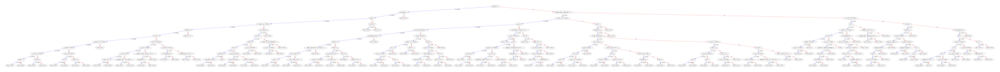

<Figure size 432x288 with 0 Axes>

In [351]:
plot_tree(xgb, feature_names=X_train.columns)
plt.gcf().set_size_inches(25, 50)
plt.show()
plt.savefig("C:/Users/adity/OneDrive/Desktop/Analytics Vidya/xgb_tree.png")

The above plot is the visualization of XGB regressor.
Study it, use the microengineering techniques to minimize the loss metric.

In [331]:
y_out=xgb.predict(test_X)
out_df=pd.DataFrame(y_out)
out_df

,0
0,190.447830
1,1214.380127
2,240.055954
3,258.460449
4,480.898499
...,...
1468,549.609985
1469,234.305252
1470,346.946259
1471,311.215607


In [332]:
writer = pd.ExcelWriter('C:/Users/adity/OneDrive/Desktop/Analytics Vidya/Book  Price Prediction/Participants_Data/submission.xlsx')
out_df.to_excel(writer)
writer.save()
